In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import yaml
from helpers.data_transforms import  load_in_data


plt.style.use("../science.mplstyle")

In [2]:

COLS = [
    "InnerTrackerEndcapCollection",
    "OuterTrackerEndcapCollection",  
    "VertexEndcapCollection",
]


feature_order_endcap = [0, 4, 1, 2, 3,  5, 6]
feature_indices_dict_endcap = {
    "r":2,
    "phi": 3,
    "z":4,
    "side":5,
    "layer":6
}

feature_order_dict = {
    "InnerTrackerEndcapCollection":feature_order_endcap,
    "OuterTrackerEndcapCollection":feature_order_endcap,  
    "VertexEndcapCollection":feature_order_endcap,

}

feature_indices_dict = {
    "InnerTrackerEndcapCollection":feature_indices_dict_endcap,
    "OuterTrackerEndcapCollection":feature_indices_dict_endcap,  
    "VertexEndcapCollection":feature_indices_dict_endcap,

}


FEATURES = "rphi"
working_dir = "/pscratch/sd/r/rmastand/muon_collider"
log_vars = []



In [3]:
# load in samples

all_data_dir, all_samples_dir = {}, {}
bins_dict, bins_dict_preproc = {}, {}
aucs = {}
feature_labels_dict = {}

for col_name in COLS:

    small_id = ''.join([c for c in col_name if c.isupper()])
    X, feature_labels = load_in_data([col_name], FEATURES, working_dir, 1, 3, feature_order_dict[col_name])
    all_data_dir[col_name] = X[:]




In [4]:
x_dir = {col_name:[] for col_name in COLS}
y_dir = {col_name:[] for col_name in COLS}
z_dir = {col_name:[] for col_name in COLS}


for col_name in COLS:

    x_dir[col_name] = all_data_dir[col_name][:,feature_indices_dict[col_name]["r"]]*np.cos(all_data_dir[col_name][:,feature_indices_dict[col_name]["phi"]])
    y_dir[col_name] = all_data_dir[col_name][:,feature_indices_dict[col_name]["r"]]*np.sin(all_data_dir[col_name][:,feature_indices_dict[col_name]["phi"]])
    z_dir[col_name] = all_data_dir[col_name][:,feature_indices_dict[col_name]["z"]]

In [28]:

from matplotlib.path import Path

def make_polygon_vertices(nsides, inradius, rotation_deg=0.0):
    """vertices of regular polygon with inradius (flat-edge radius) = inradius."""
    circumradius = inradius / np.cos(np.pi / nsides)
    angles = np.linspace(0, 2*np.pi, nsides, endpoint=False) + np.deg2rad(rotation_deg)
    return np.stack([circumradius * np.cos(angles), circumradius * np.sin(angles)], axis=1)

def points_in_polygon(x, y, vertices):
    path = Path(np.vstack([vertices, vertices[0]]))
    return path.contains_points(np.stack([x, y], axis=1))

def make_polygonal_annulus_mask(x, y, z, disks, nsides=12, rotation_deg=90.0, z_tolerance=2.0, reflect=True):
    """
    Polygonal annulus mask — both inner and outer boundaries are polygons.
    disks: list of {'z', 'rmin', 'rmax'}
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    z = np.asarray(z, dtype=float)

    mask = np.zeros(len(x), dtype=bool)

    for disk in disks:
        z_match = np.abs(z - disk['z']) <= z_tolerance
        if reflect:
            z_match |= np.abs(z + disk['z']) <= z_tolerance

        if not z_match.any():
            continue

        outer_verts = make_polygon_vertices(nsides, disk['rmax'], rotation_deg)
        inner_verts = make_polygon_vertices(nsides, disk['rmin'], rotation_deg)

        in_outer = points_in_polygon(x, y, outer_verts)
        in_inner = points_in_polygon(x, y, inner_verts)

        mask |=  in_outer & ~in_inner

    return mask

# ── Disk definitions ──────────────────────────────────────────────────────────

VERTEX_ENDCAP_DISKS = [
    {'z': 80,   'rmin': 25,  'rmax': 112},
    {'z': 82,   'rmin': 25,  'rmax': 112},
    {'z': 120,  'rmin': 31,  'rmax': 112},
    {'z': 122,  'rmin': 31,  'rmax': 112},
    {'z': 200,  'rmin': 38,  'rmax': 112},
    {'z': 202,  'rmin': 38,  'rmax': 112},
    {'z': 280,  'rmin': 53,  'rmax': 112},
    {'z': 282,  'rmin': 53,  'rmax': 112},
]

INNER_ENDCAP_DISKS = [
    {'z': 524,  'rmin': 95,  'rmax': 405},
    {'z': 808,  'rmin': 147, 'rmax': 555},
    {'z': 1093, 'rmin': 190, 'rmax': 555},
    {'z': 1377, 'rmin': 212, 'rmax': 555},
    {'z': 1661, 'rmin': 237, 'rmax': 555},
    {'z': 1946, 'rmin': 264, 'rmax': 555},
    {'z': 2190, 'rmin': 284, 'rmax': 555},
]

OUTER_ENDCAP_DISKS = [
    {'z': 1310, 'rmin': 617.5, 'rmax': 1430.2},
    {'z': 1617, 'rmin': 617.5, 'rmax': 1430.2},
    {'z': 1883, 'rmin': 617.5, 'rmax': 1430.2},
    {'z': 2190, 'rmin': 617.5, 'rmax': 1430.2},
]

masks = {}


masks["InnerTrackerEndcapCollection"] = make_polygonal_annulus_mask(x_dir["InnerTrackerEndcapCollection"], 
                                                            y_dir["InnerTrackerEndcapCollection"], 
                                                            z_dir["InnerTrackerEndcapCollection"],
                                                            INNER_ENDCAP_DISKS, z_tolerance=800000.0, nsides=26)
masks["OuterTrackerEndcapCollection"] = make_polygonal_annulus_mask(x_dir["OuterTrackerEndcapCollection"], 
                                                            y_dir["OuterTrackerEndcapCollection"], 
                                                            z_dir["OuterTrackerEndcapCollection"],
                                                            OUTER_ENDCAP_DISKS, z_tolerance=800000.0, nsides=48, rotation_deg = 3.75)
masks["VertexEndcapCollection"] = make_polygonal_annulus_mask(x_dir["VertexEndcapCollection"], 
                                                            y_dir["VertexEndcapCollection"], 
                                                            z_dir["VertexEndcapCollection"],
                                                            VERTEX_ENDCAP_DISKS, z_tolerance=800000.0, nsides=16)

# ── Usage ─────────────────────────────────────────────────────────────────────
for col_name in COLS:
    mask = masks[col_name]
    print(f"{col_name}: {mask.sum()}/{len(mask)} hits kept ({100*mask.mean():.1f}%)")

InnerTrackerEndcapCollection: 1612515/1614679 hits kept (99.9%)
OuterTrackerEndcapCollection: 1465104/1465825 hits kept (100.0%)
VertexEndcapCollection: 4096369/4096371 hits kept (100.0%)


InnerTrackerEndcapCollection
-2194.8524957761656 2194.8524985378663 [-2194.9 -2188.9 -1947.1 -1941.1 -1665.9 -1659.9 -1378.1 -1372.1 -1097.9
 -1091.9  -809.1  -803.1  -528.9  -522.9   522.9   528.9   803.1   809.1
  1091.9  1097.9  1372.1  1378.1  1659.9  1665.9  1941.1  1947.1  2188.9
  2194.9]


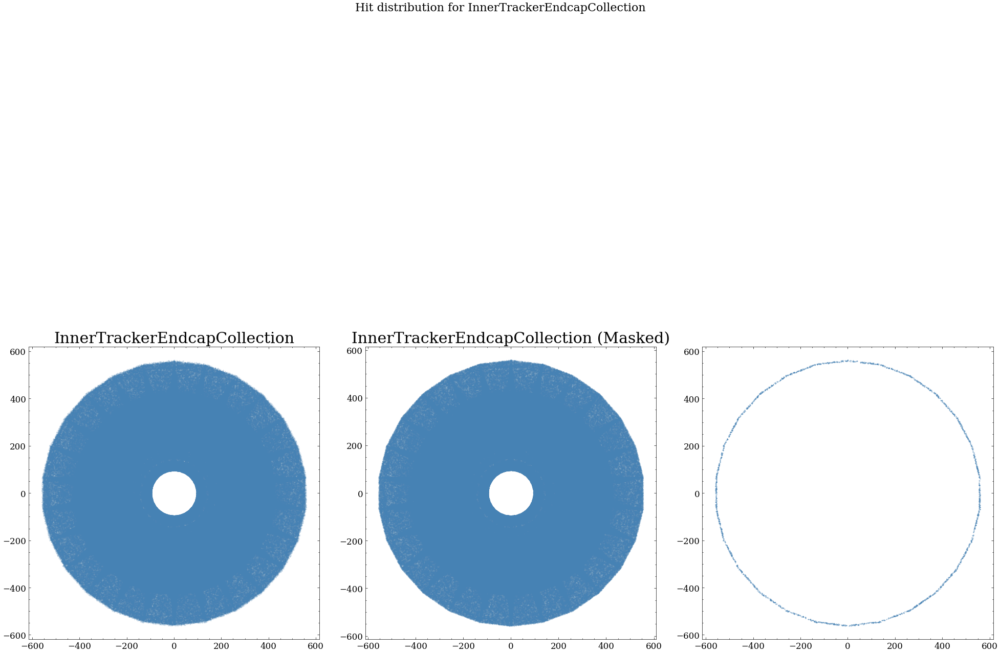

OuterTrackerEndcapCollection
-2194.8524998727157 2194.8524997040827 [-2194.9 -2188.9 -1884.1 -1878.1 -1621.9 -1615.9 -1311.1 -1305.1  1305.1
  1311.1  1615.9  1621.9  1878.1  1884.1  2188.9  2194.9]


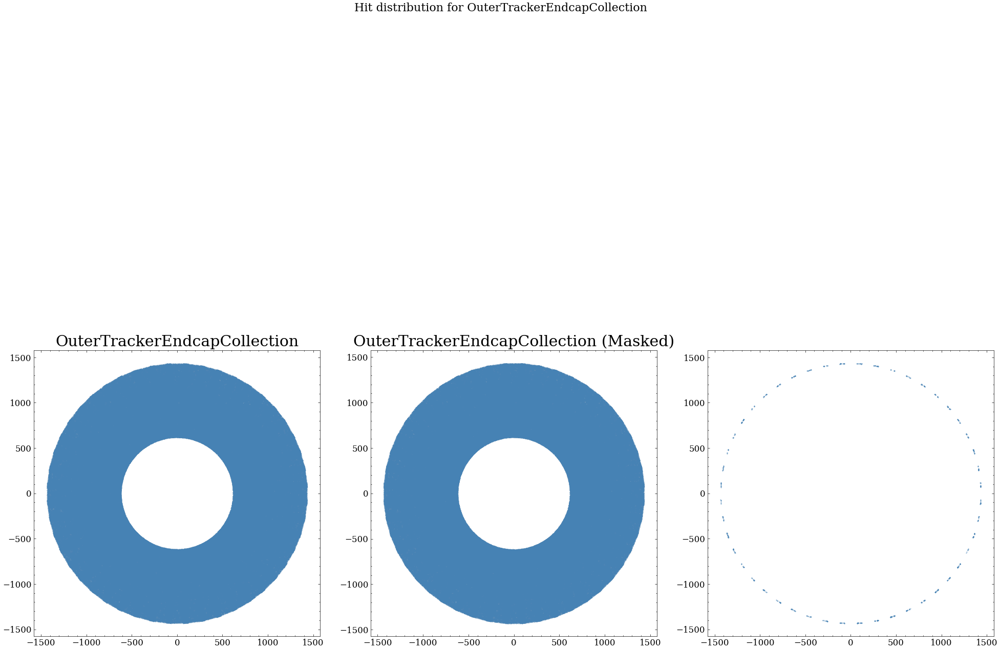

VertexEndcapCollection
-284.1909991213631 284.19099990096703 [-284.2 -280.1 -204.2 -200.1 -124.2 -120.1  -84.2  -80.1   80.1   84.2
  120.1  124.2  200.1  204.2  280.1  284.2]


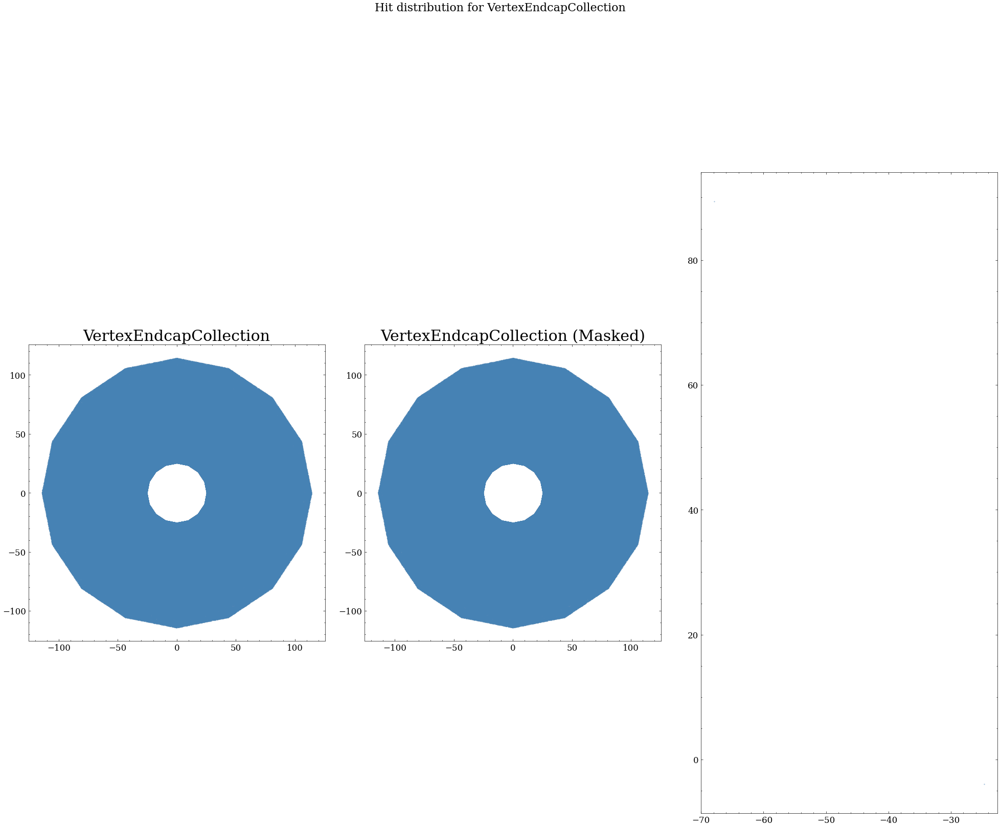

In [29]:
import matplotlib.pyplot as plt

for col_name in COLS:

    fig, ax = plt.subplots(1, 3, figsize=(20, 20))

    x = np.asarray(x_dir[col_name][:])
    y = np.asarray(y_dir[col_name][:])
    z = np.asarray(z_dir[col_name][:])

    print(col_name)
    print(z.min(), z.max(), np.unique(z.round(1)))


    # plot hits
    ax[0].scatter(x, y, s=0.01, c='steelblue', alpha=1, label='hits')

    ax[1].scatter(x[masks[col_name]], y[masks[col_name]], s=0.01, c='steelblue', alpha=1, label='hits')

    ax[2].scatter(x[~masks[col_name]], y[~masks[col_name]], s=0.1, c='steelblue', alpha=1, label='hits')

    
    ax[0].set_aspect('equal')
    ax[1].set_aspect('equal')
    ax[2].set_aspect('equal')
    ax[0].set_title(col_name)
    ax[1].set_title(f"{col_name} (Masked)")

    plt.tight_layout()
    plt.suptitle(f"Hit distribution for {col_name}", fontsize=16)
    plt.show()

In [22]:
sides = {
    "VertexEndcapCollection": 16, 
    "OuterTrackerEndcapCollection": 48, 
    "InnerTrackerEndcapCollection": 26
}

rotations = {
    "VertexEndcapCollection": 90, 
    "OuterTrackerEndcapCollection": 3.75, 
    "InnerTrackerEndcapCollection": 90
}



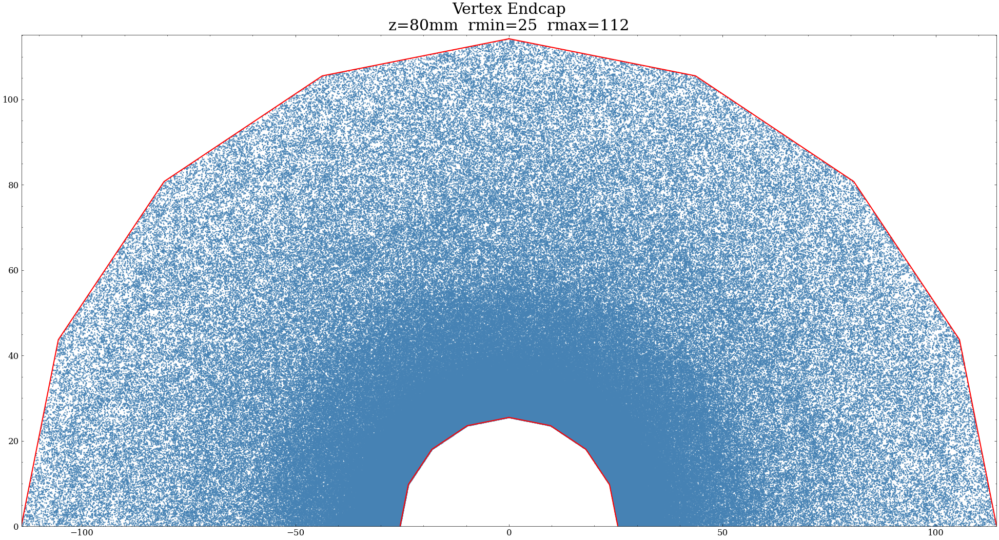

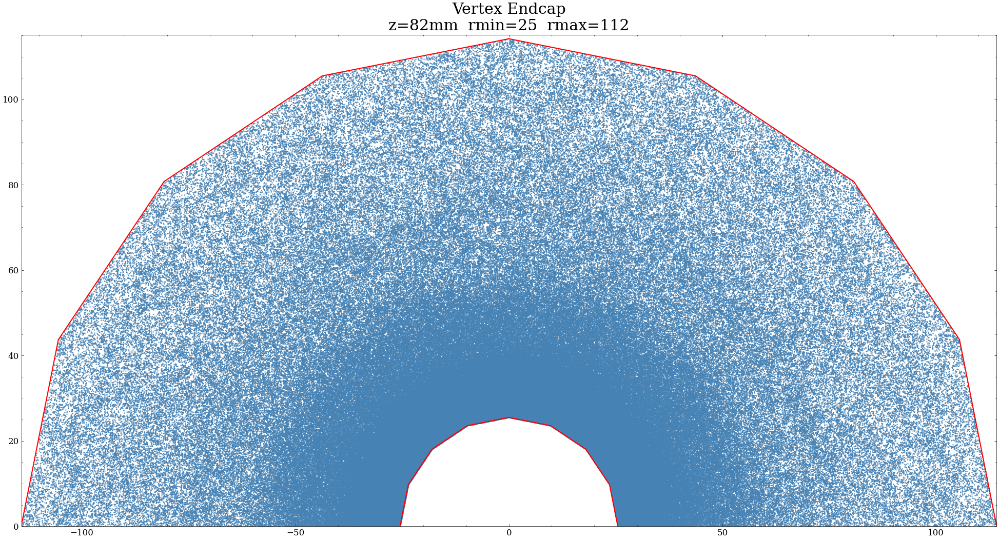

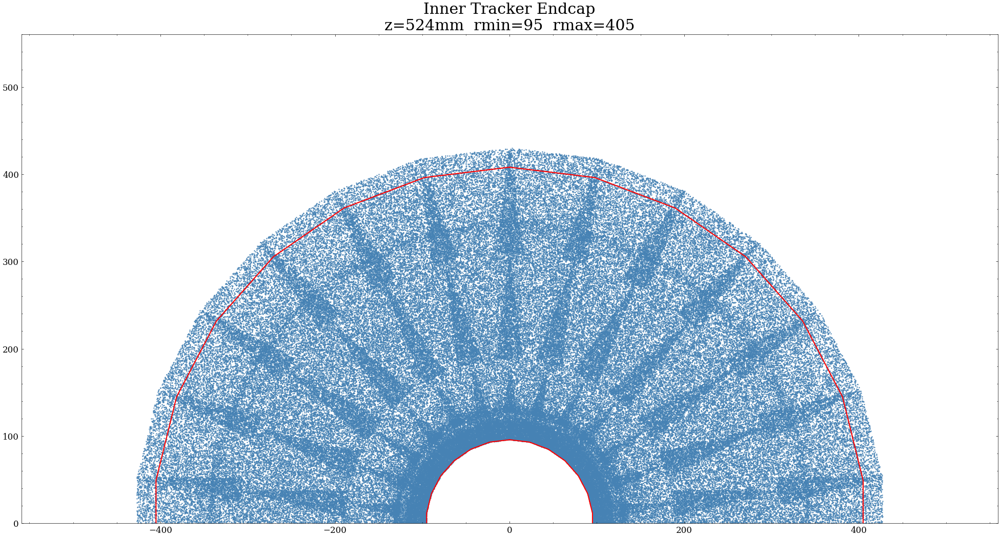

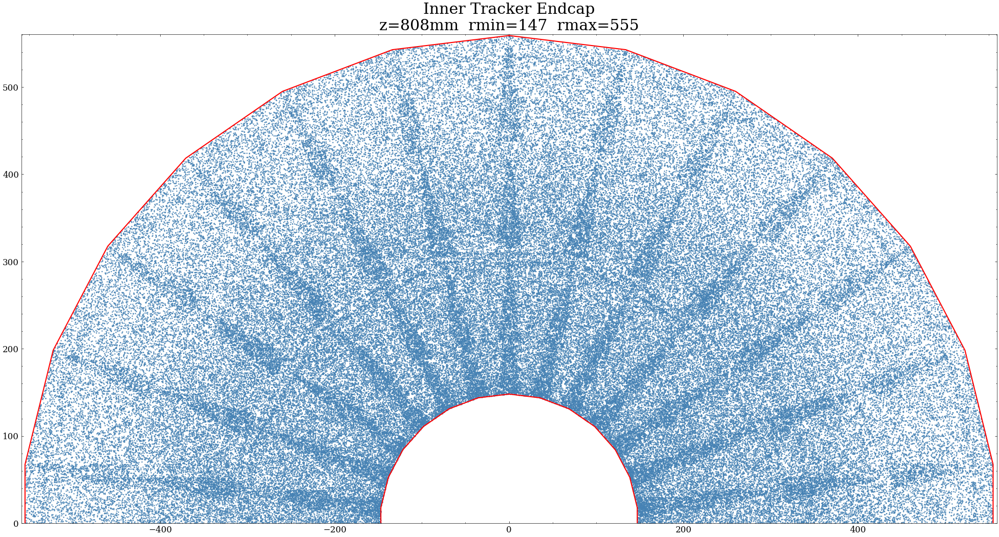

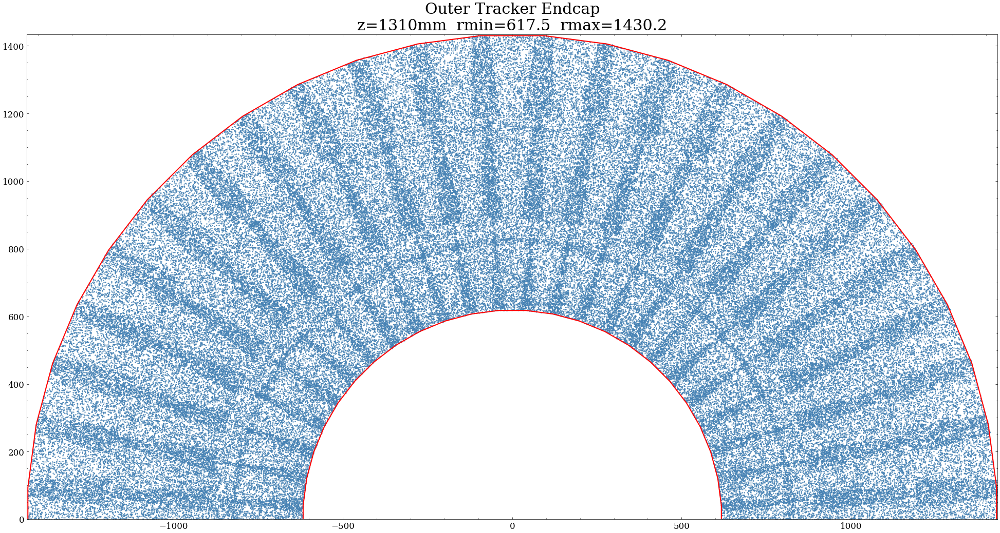

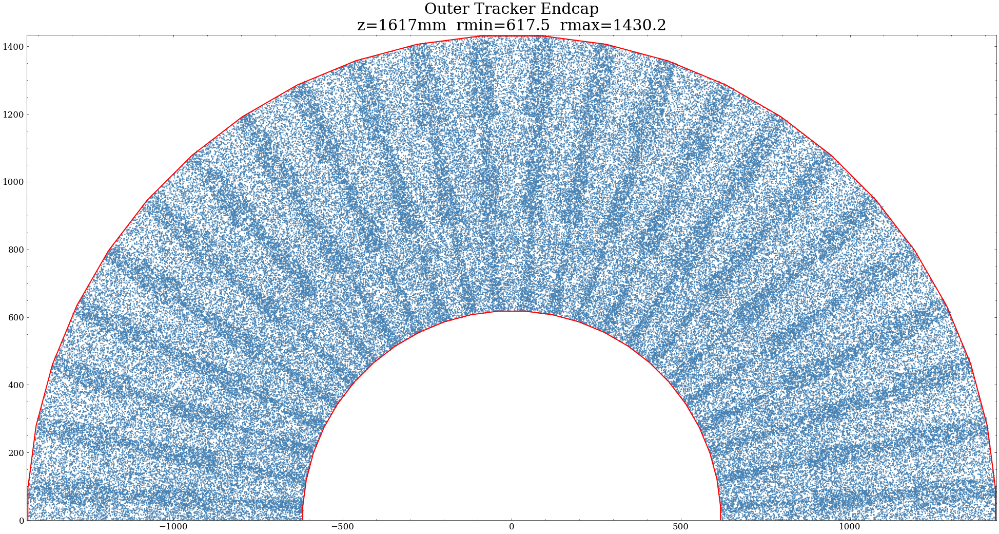

In [25]:

endcaps = [
    ('VertexEndcapCollection',        VERTEX_ENDCAP_DISKS,  'Vertex Endcap'),
    ('InnerTrackerEndcapCollection',  INNER_ENDCAP_DISKS,   'Inner Tracker Endcap'),
    ('OuterTrackerEndcapCollection',  OUTER_ENDCAP_DISKS,   'Outer Tracker Endcap'),
]

for col_idx, (col_name, disks, title) in enumerate(endcaps):
    x = np.asarray(x_dir[col_name], dtype=float)
    y = np.asarray(y_dir[col_name], dtype=float)
    z = np.asarray(z_dir[col_name], dtype=float)

    # pick 3 disks spread across the range
    selected = [disks[0], disks[1]]

    for row_idx, disk in enumerate(selected):

        plt.figure(figsize = (20, 20))

        z_match = (np.abs(z - disk['z']) <= 8.0) | (np.abs(z + disk['z']) <= 8.0)

        outer_verts = make_polygon_vertices(sides[col_name], disk['rmax'], rotation_deg=rotations[col_name])
        inner_verts = make_polygon_vertices(sides[col_name], disk['rmin'], rotation_deg=rotations[col_name])

        plt.scatter(x[z_match], y[z_match], s=0.5, alpha=1, c='steelblue')

        for verts in [outer_verts, inner_verts]:
            closed = np.vstack([verts, verts[0]])
            plt.plot(closed[:, 0], closed[:, 1], 'r-', lw=1.5)

        plt.gca().set_aspect('equal')
        plt.title(f"{title}\nz={disk['z']}mm  rmin={disk['rmin']}  rmax={disk['rmax']}")

        plt.tight_layout()
        plt.xlim(-np.max(x), np.max(x))
        plt.ylim(0, np.max(x) + 1)
        plt.show()